In [1]:
import gdal
#from osgeo import gdal
from numpy import *

import matplotlib.pyplot as plt
%matplotlib inline

import rasterio
from rasterio import plot

from spectral import *
import spectral.io.envi

from rasterio.plot import show

In [2]:
%run filmstrip

ready...


In [47]:
import geopandas
og = geopandas.read_file("Non_Eucalyptus_Reg_Ecos/Non_Eucalypt_RE.shp")
ogo = geopandas.read_file("FF_SingleSp_RE_2017_V11.shp")

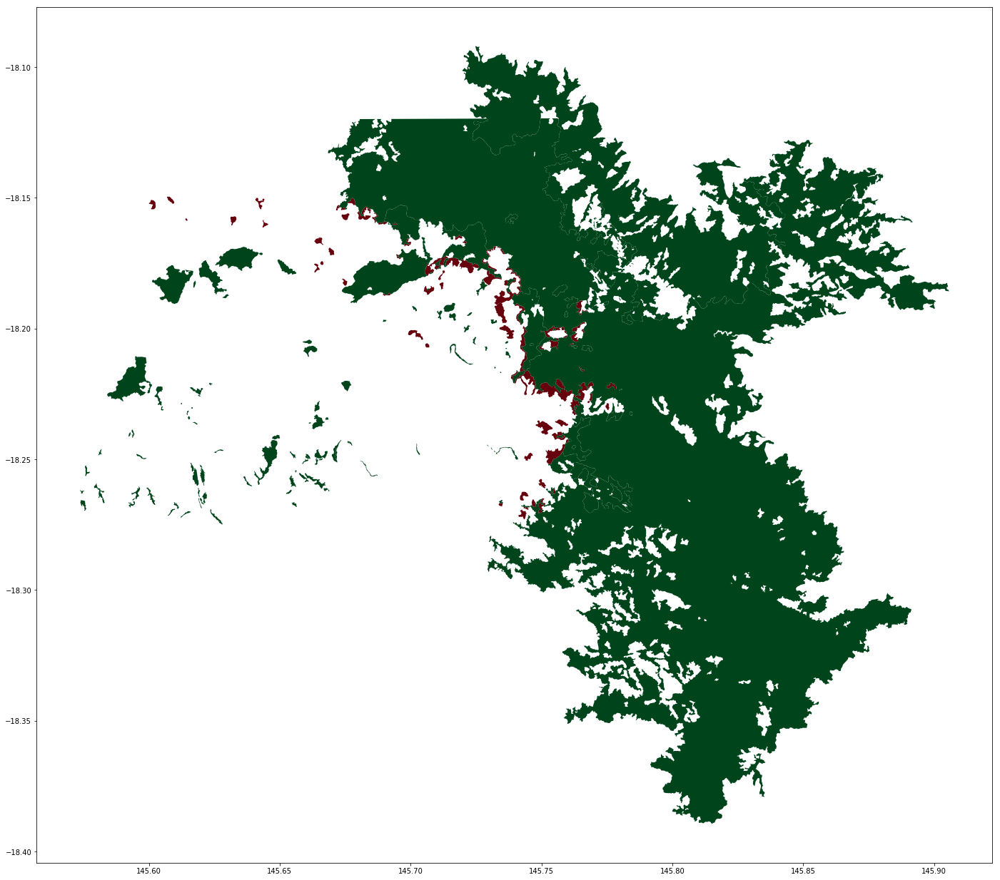

In [48]:
fg = 24

polygon2 = Polygon([
                    [145.5744, -18.27014],
                    [145.78456, -18.27014],
                    [145.78456, -18.1522],
                    [145.5744, -18.1522],
                    [145.5744, -18.27014]
                ])
subset2 = ogo[ogo.intersects(polygon2)]
subset2ne = og[og.intersects(polygon2)]
ax = subset2.plot(color='white',figsize=(fg,fg))

cmap_reds=plt.cm.get_cmap('Reds', 2)
cmap_hot=plt.cm.get_cmap('Greens', 2)

subset2x = subset2
subset2x.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))
        
subset2x = subset2ne
subset2x.plot(ax=ax,color=cmap_hot(2),figsize=(fg,fg))

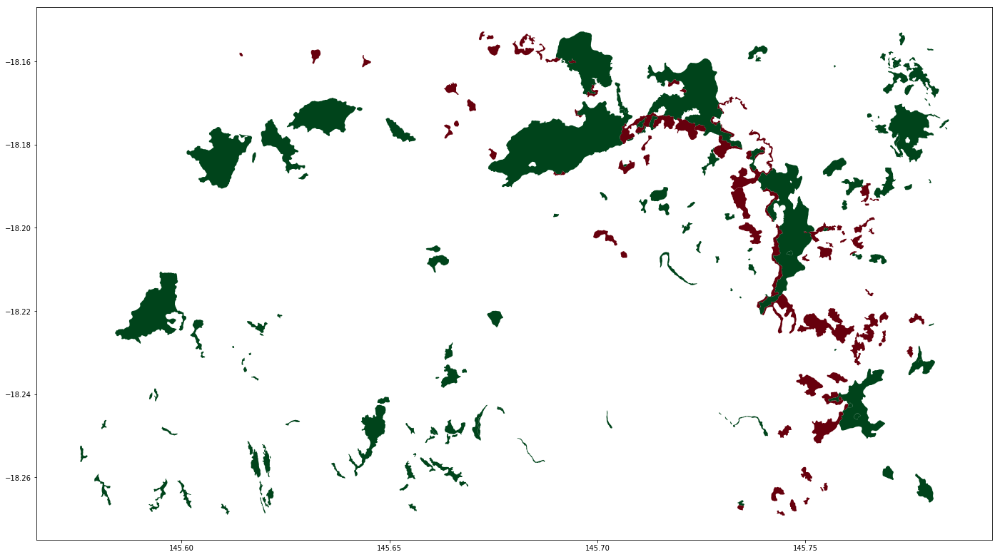

In [103]:
fg = 24

polygon2 = Polygon([
                    [145.5744, -18.27014],
                    [145.78456, -18.27014],
                    [145.78456, -18.1522],
                    [145.5744, -18.1522],
                    [145.5744, -18.27014]
                ])
subset2 = ogo[ogo.within(polygon2)]
subset2ne = og[og.within(polygon2)]
ax = subset2.plot(color='white',figsize=(fg,fg))

cmap_reds=plt.cm.get_cmap('Reds', 2)
cmap_hot=plt.cm.get_cmap('Greens', 2)

subset2x = subset2
subset2x.plot(ax=ax,color=cmap_reds(2),figsize=(fg,fg))
        
subset2x = subset2ne
subset2x.plot(ax=ax,color=cmap_hot(2),figsize=(fg,fg))

In [9]:
rpath= "/Users/brian/code/firedamage/zone1_2/b7009c0a-afb1-4906-afea-7a0b7e5858d6/3/files/"


stem = "LC08_L1TP_095073_20191016_20191029"
fntag = "zone1_2"
ls2envi_full(rpath,stem,fntag)

In [10]:
sds = gdal.Open("/Users/brian/code/FloweringPolygons/"+fntag+"_reflectance_full.tif")
driver = gdal.GetDriverByName('ENVI')
dst = driver.CreateCopy("/Users/brian/code/FloweringPolygons/"+fntag+"_reflectance_full.bil",sds)
dst = None
spy_image = envi.open("/Users/brian/code/FloweringPolygons/"+fntag+"_reflectance_full.hdr",
                      image="/Users/brian/code/FloweringPolygons/"+fntag+"_reflectance_full.bil")


In [11]:
spy_image.nbands

12

ImageView object:
  Display bands       :  (3, 2, 1)
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.0, 17378.0]
    G: [0.0, 14888.0]
    B: [0.0, 13703.0]

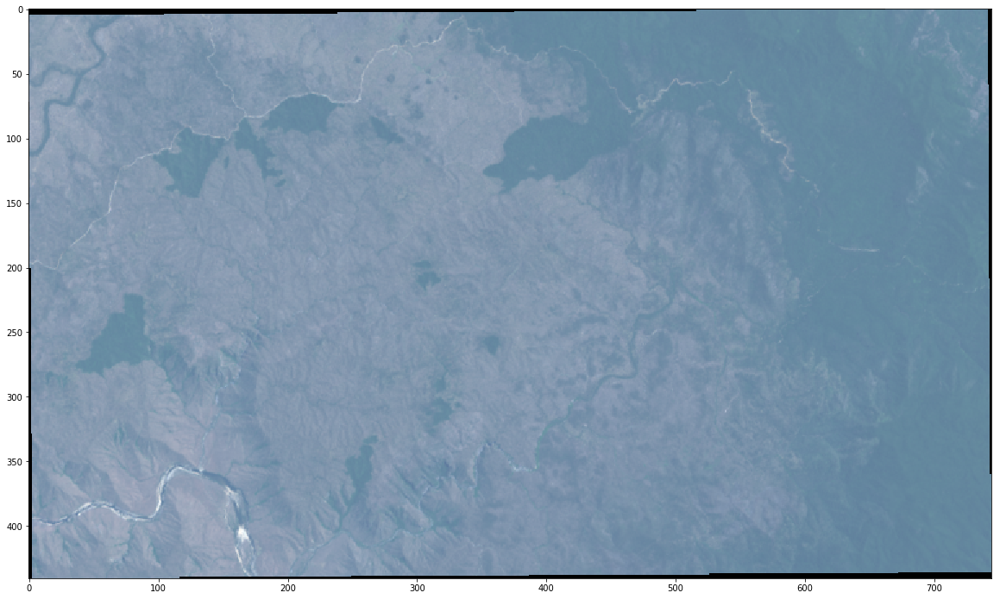

In [104]:
imshow(spy_image, (3,2,1), figsize=(20,20))

In [13]:
import geopandas
noneuc = geopandas.read_file("Non_Eucalyptus_Reg_Ecos/Non_Eucalypt_RE.shp")
euc = geopandas.read_file("FF_SingleSp_RE_2017_V11.shp")

ucl = euc['QLD_REG_EC'].unique().tolist()
euco = {k: v for v, k in enumerate(ucl)}

nonucl = noneuc['RE'].unique().tolist()
noneuco = {k: v for v, k in enumerate(nonucl)}

zg = {**euco, **noneuco}
import copy
zgz = copy.deepcopy(zg)
counter = 10
zk = list(zgz.keys())
for p in range(0,len(zgz)):
    zgz[zk[p]] = counter
    counter += 1

In [44]:
%run create_training_polygons
hsf = "/Users/brian/code/FloweringPolygons/"+fntag+"_reflectance_full.tif"
#hnon = xkpls(hsf,spy_image,8,'sub2polyNE.csv',4326,4283,32654,0,535,0,7590,zgz)
hnon = xkpls(hsf,spy_image,8,'sub2polyNE.csv',4326,4283,32655,0,441,0,745,zgz)

ready...
------src.ref_____
+init=epsg:32655
---------lbrt-------------
349185.0 -2020665.0 371535.0 -2007435.0
---------spoly-------------
POLYGON ((349185 -2007435, 349185 -2020665, 371535 -2020665, 371535 -2007435, 349185 -2007435))
image pixel dimensions:
(441, 745, 12)
xpoly.bounds: (349185.0, -2020665.0, 371535.0, -2007435.0)
chd:13230.0 cwd:22350.0
poly number: 1


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2821: DtypeWarning: Columns (13,14,15,16,17,18,21,22,23,24,26,27,28,29,30,31,32,33,34,37,50,54,56,58,60,61,62,64,70,71,83,84,85) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


dfn: 78113
hits number: 259
done.


In [38]:
type(hnon)
hnon.ndim
hnon.size
hnon.shape

(441, 745)

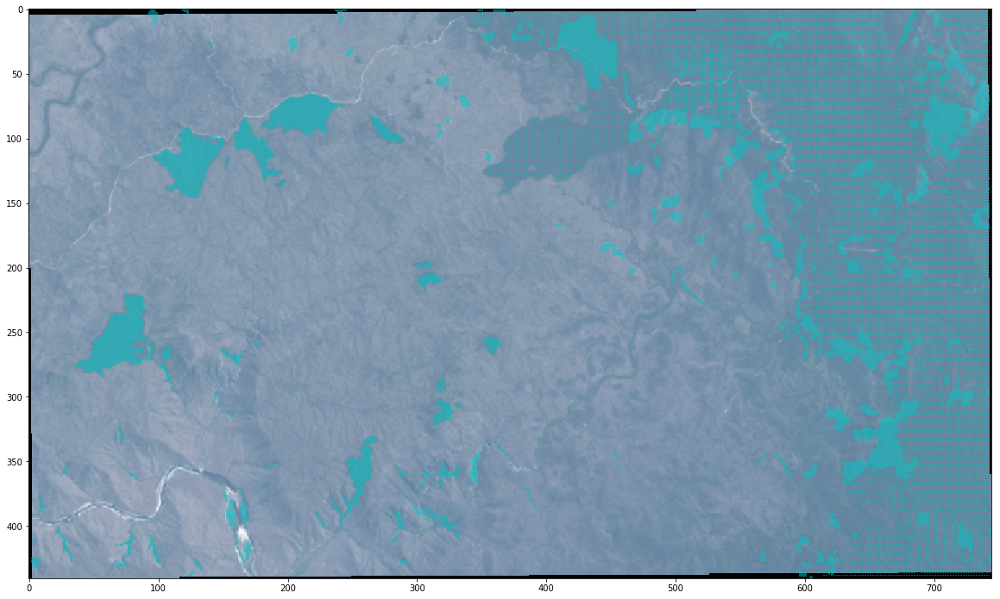

In [45]:

view = imshow(spy_image, (3, 2, 1), classes=hnon,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.5

Setting min samples to 12
Covariance.....  0.0%Covariance.....  0.0%Covariance.....done  
Covariance.....  0.0%Covariance.....  0.0%Covariance.....done  
Classifying image...  0.0%Classifying image...done  


ImageView object:
  Interpolation       :  <default>

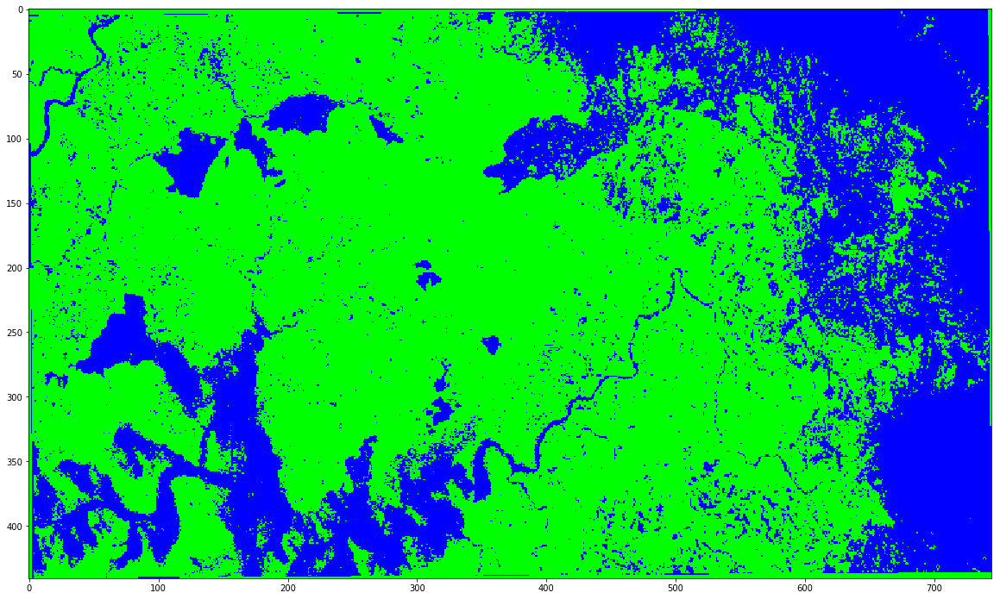

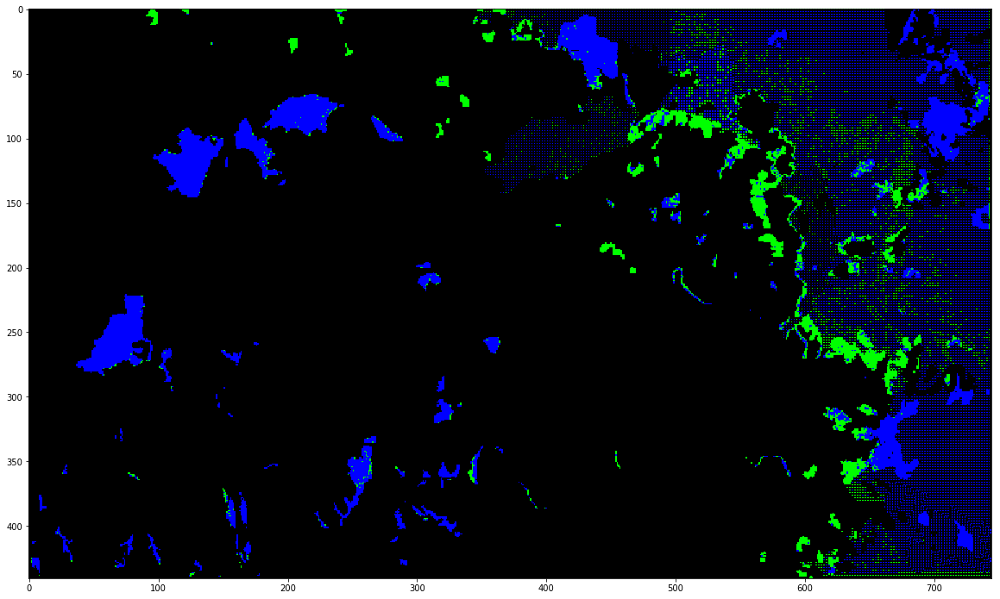

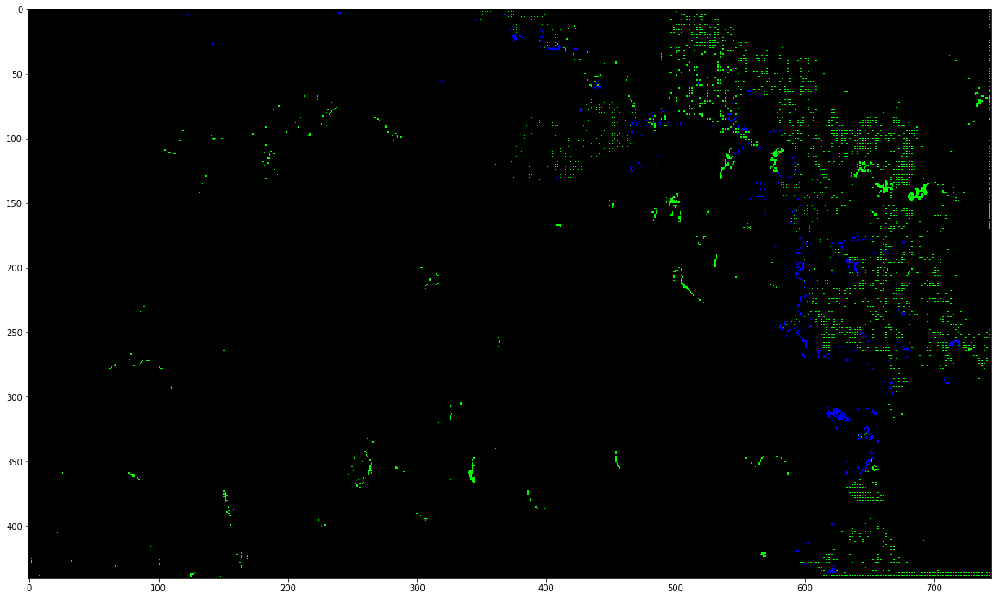

In [46]:
import spectral as spy
traint = spy.create_training_classes(spy_image,hnon)
gmlc1 = GaussianClassifier(traint)
clmap1 = gmlc1.classify_image(spy_image)
imshow(classes=clmap1,figsize=(20,20))
gtresultst1 = clmap1 * (hnon != 0)
v = imshow(classes=gtresultst1,figsize=(20,20))
training_errors2 = gtresultst1 * (gtresultst1 != hnon)
imshow(classes=training_errors2,figsize=(20,20))

In [53]:
import pandas as pd
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
gnf = gtresultst1.flatten()
gnfnz = gnf[gnf != 0]

y_actu = pd.Series(hnfnz, name='Actual')
y_pred = pd.Series(gnfnz.flatten(), name='Predicted')
df_confusion_nz = pd.crosstab(y_actu, y_pred)

df_conf_norm = df_confusion_nz / df_confusion_nz.sum(axis=1)
df_conf_norm

Predicted,2,3
Actual,,
2.0,0.869440,0.026193
3.0,0.547878,0.890085


In [58]:
import sklearn
from sklearn import metrics
print("Cohen's Kappa:")
print(sklearn.metrics.cohen_kappa_score(y_actu, y_pred))
print("\nBalanced Accuracy:")
print(sklearn.metrics.balanced_accuracy_score(y_actu, y_pred))
print("\n")
print(sklearn.metrics.classification_report(y_actu, y_pred, digits=3))

Cohen's Kappa:
0.6509479547518336

Balanced Accuracy:
0.8797622702530716


              precision    recall  f1-score   support

         2.0      0.613     0.869     0.719      5890
         3.0      0.971     0.890     0.929     29359

    accuracy                          0.887     35249
   macro avg      0.792     0.880     0.824     35249
weighted avg      0.912     0.887     0.894     35249



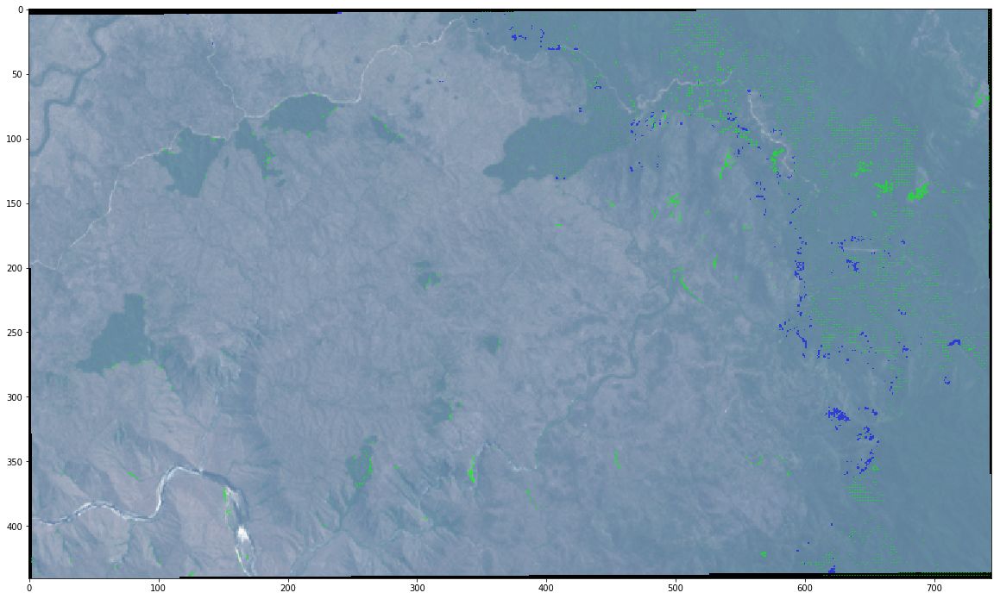

In [51]:

view = imshow(spy_image, (3, 2, 1), classes=training_errors2,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.75

In [59]:
    def classify_image_wp(self, image):
        '''Classifies an entire image, returning a classification map.
        Arguments:
            `image` (ndarray or :class:`spectral.Image`)
                The `MxNxB` image to classify.
        Returns (ndarray):
            An `MxN` ndarray of integers specifying the class for each pixel.
        '''
        import math
        import spectral
        self.cache_class_scores = True
        #if not (self.cache_class_scores and isinstance(image, np.ndarray)):
        #    return super(GaussianClassifier, self).classify_image(image)

        status = spectral._status
        status.display_percentage('Processing...')
        shape = image.shape
        image = image.reshape(-1, shape[-1])
        scores = np.empty((image.shape[0], len(self.classes)), np.float64)
        delta = np.empty_like(image, dtype=np.float64)

        # For some strange reason, creating Y with np.emtpy_like will sometimes
        # result in the following error when attempting an in-place np.dot:
        #     ValueError: output array is not acceptable (must have the right
        #     type, nr dimensions, and be a C-Array)
        # It appears that this may be happening when delta is not contiguous,
        # although it isn't clear why the alternate construction of Y below
        # does work.
        Y = np.empty_like(delta)

        for (i, c) in enumerate(self.classes):
            scalar = math.log(c.class_prob) - 0.5 * c.stats.log_det_cov
            delta = np.subtract(image, c.stats.mean, out=delta)
            try:
                Y = delta.dot(-0.5 * c.stats.inv_cov, out=Y)
            except:
                # Unable to output np.dot to existing array. Allocate new
                # storage instead. This will not affect results but may be
                # slower.
                Y = delta.dot(-0.5 * c.stats.inv_cov)
            scores[:, i] = np.einsum('ij,ij->i', Y, delta)
            scores[:, i] += scalar
            print(scores.shape)
            status.update_percentage(100. * (i + 1) / len(self.classes))
            print(c)
        status.end_percentage()
        inds = np.array([c.index for c in self.classes], dtype=np.int16)
        mins = np.argmax(scores, axis=-1)
        #return inds[mins].reshape(shape[:2])
        return scores

In [60]:
    def classify_spectrum_ws(self, x):
        '''
        Classifies a pixel into one of the trained classes.
        Arguments:
            `x` (list or rank-1 ndarray):
                The unclassified spectrum.
        Returns:
            `classIndex` (int):
                The index for the :class:`~spectral.algorithms.TrainingClass`
                to which `x` is classified.
        '''
        from math import log

        scores = np.empty(len(self.classes))
        for (i, cl) in enumerate(self.classes):
            delta = (x - cl.stats.mean)
            scores[i] = log(cl.class_prob) - 0.5 * cl.stats.log_det_cov \
               - 0.5 * delta.dot(cl.stats.inv_cov).dot(delta)
        #return self.classes[np.argmax(scores)].index
        return scores

In [189]:
import spectral# as spy
image = spy_image
#from spy.algorithms import ImageIterator
from numpy import zeros
status = spectral._status
status.display_percentage('Classifying image...')
it = spectral.algorithms.ImageIterator(image)

class_map = zeros(image.shape[:2], np.int16)
score_map1 = zeros(image.shape[:2], np.int16)
score_map2 = zeros(image.shape[:2], np.int16)

class_map = zeros(image.shape[:2], np.float32)
score_map1 = zeros(image.shape[:2], np.float32)
score_map2 = zeros(image.shape[:2], np.float32)

#score_map3 = zeros(image.shape[:2], np.int16)
N = it.get_num_elements()
i, inc = (0, N / 100)
storn = []
storner = []
for spectrum in it:
    #print(classify_spectrum_ws(gmlcwp8,spectrum))
    stor = classify_spectrum_ws(gmlc1,spectrum)
    
    if not i % 100000:
        print(stor)
    #class_map[it.row, it.col] = classify_spectrum_ws(gmlcwp8,spectrum)
    score_map1[it.row, it.col] = stor[0]
    score_map2[it.row, it.col] = stor[1]
    #score_map3[it.row, it.col] = stor[2]
    storx = [0,0,0]
    storx[0] = abs(stor[0])
    storx[1] = abs(stor[1])
    #storx[2] = abs(stor[2])
    storn.append(storx)
    storcx = [0,0,0,0]
    storcx[0] = abs(stor[0])
    storcx[1] = abs(stor[1])
    storcx[2] = it.row
    storcx[3] = it.col
    storner.append(storcx)
    i += 1
    if not i % inc:
        status.update_percentage(float(i) / N * 100.)
        status.end_percentage()

Classifying image...  0.0%[ -81.34307046 -100.76222062]
[-64.8637193 -78.3003231]
[-64.85318231 -79.93302943]
[-71.88996352 -72.33971172]


In [190]:
x = abs(score_map2 - score_map1)
xx = x

In [188]:
score_map2

array([[-100, -100, -100, ..., -100, -100, -100],
       [-100, -100, -100, ..., -100, -100, -100],
       [-100, -100, -100, ..., -100, -100, -100],
       ...,
       [-100, -100, -100, ..., -100, -100, -100],
       [-100, -100, -100, ..., -100, -100, -100],
       [-100, -100, -100, ..., -100, -100, -100]], dtype=int16)

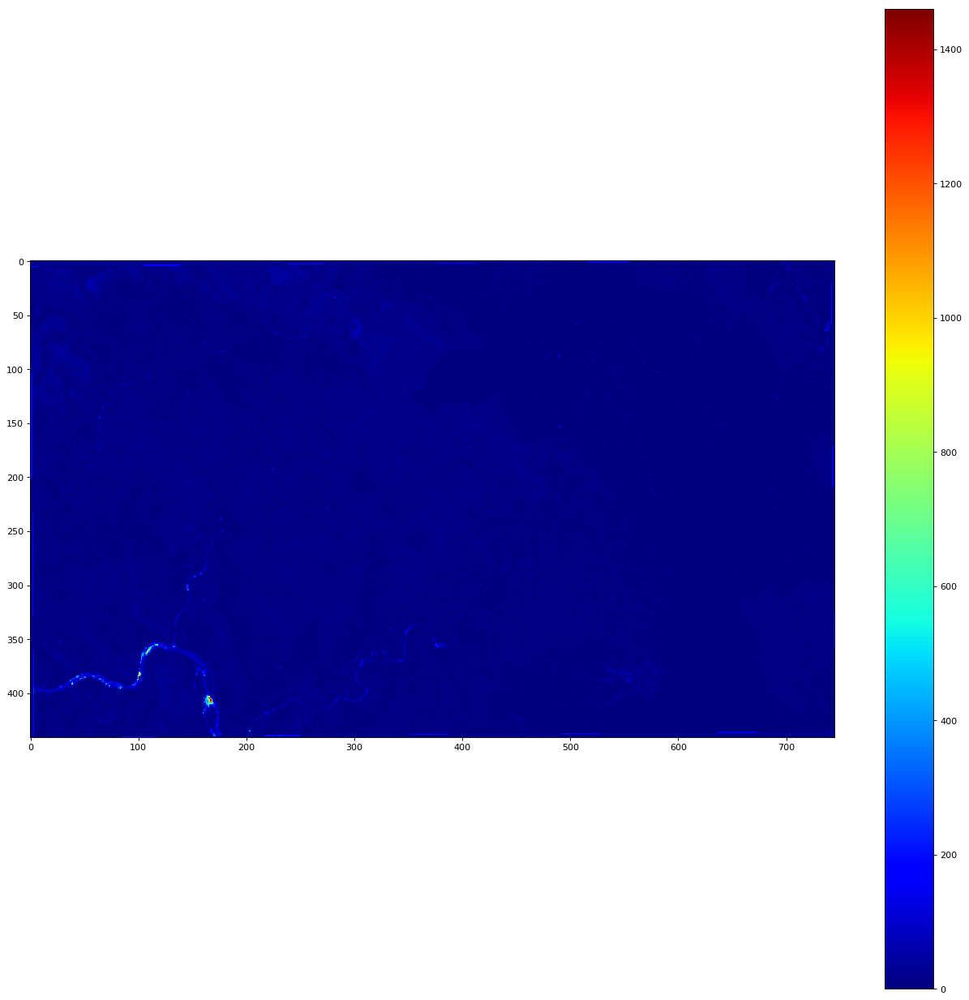

In [155]:
plt.set_cmap('jet')
plt.figure(figsize=(20, 20), dpi=80)
plt.imshow(xx)
plt.colorbar()
plt.show()

In [72]:
xx = zeros(spy_image.shape[:2], np.int16)
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(x[i][j]<100.0):
            xx[i][j] = x[i][j]
        else:
            xx[i][j] = 100.0

In [73]:
spy_image.shape

(441, 745, 12)

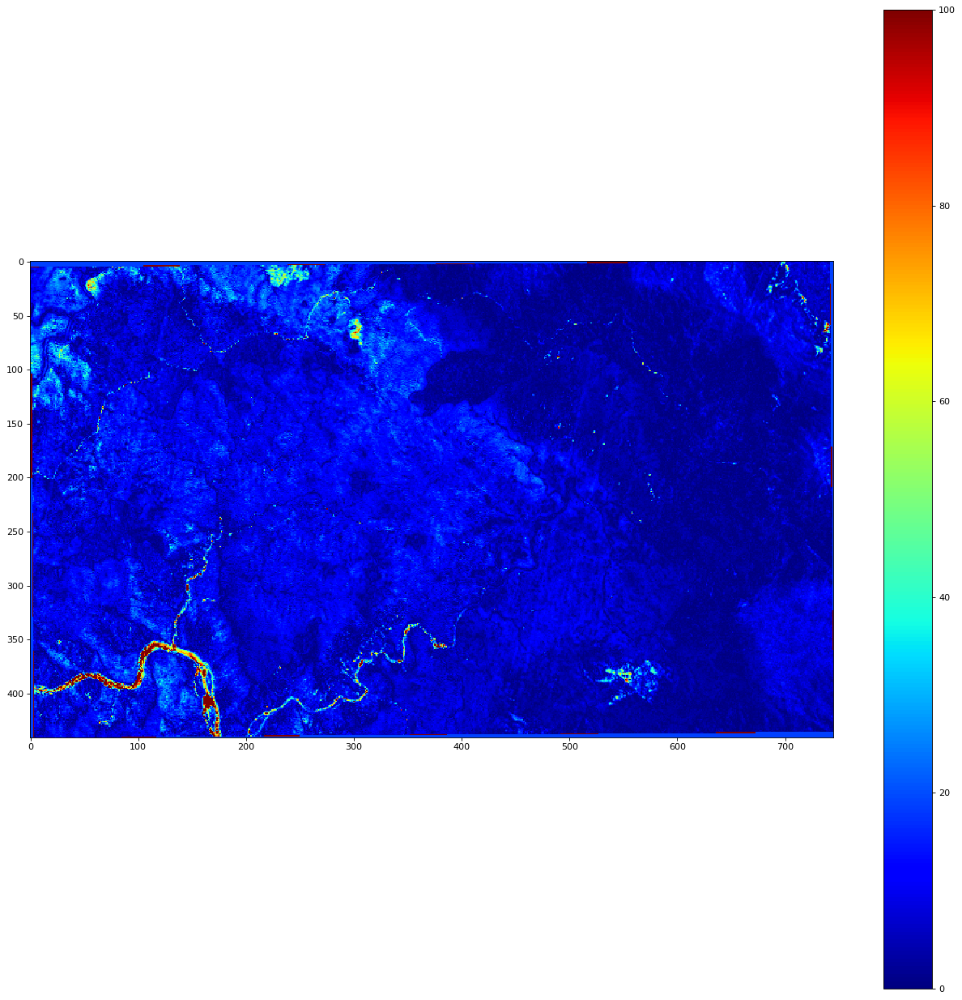

In [74]:
plt.set_cmap('jet')
plt.figure(figsize=(20, 20), dpi=80)
plt.imshow(xx)
plt.colorbar()
plt.show()

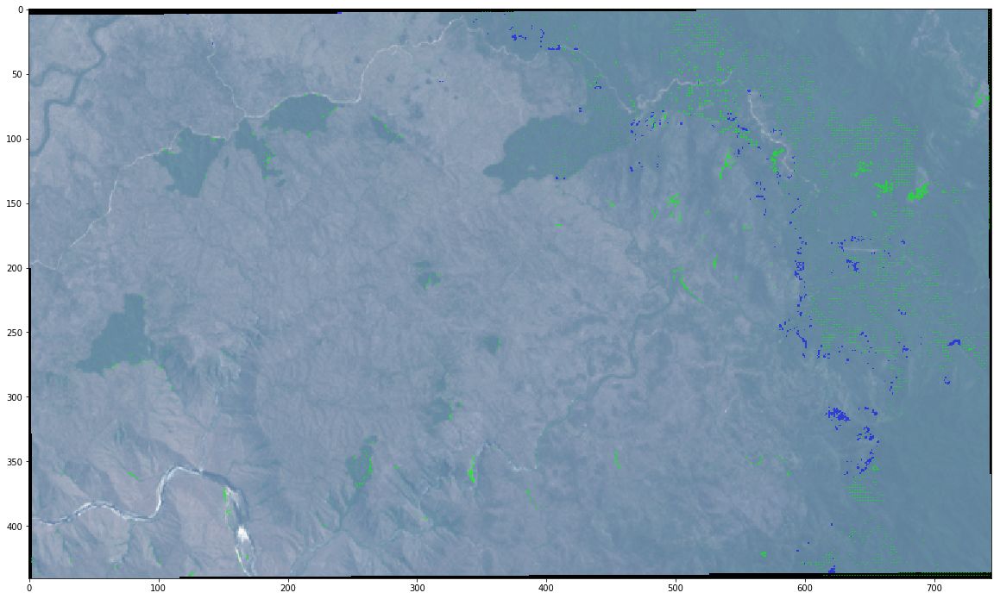

In [156]:
view = imshow(spy_image, (3, 2, 1), classes=training_errors2,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.75

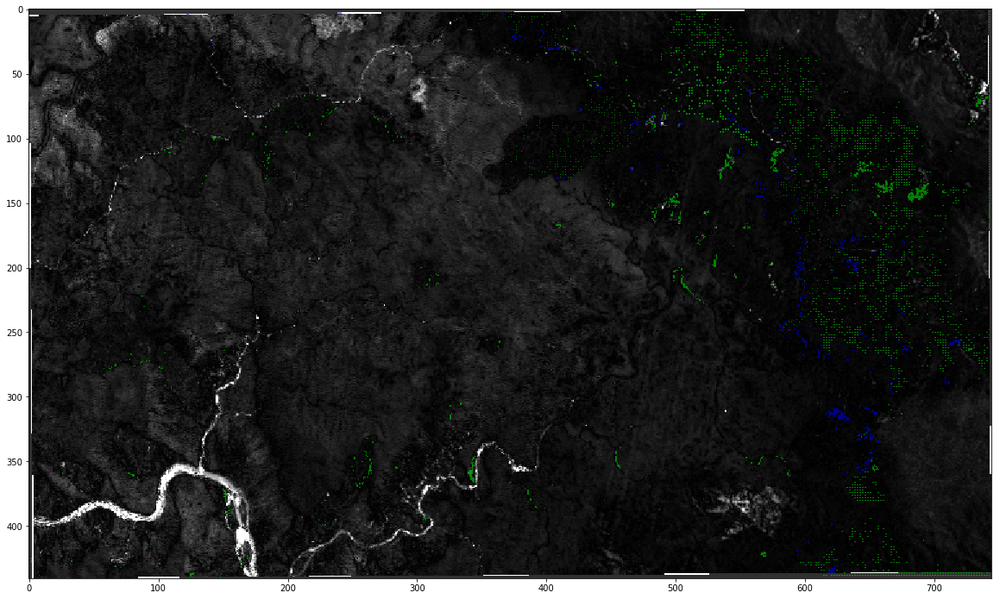

In [81]:
view = imshow(xx, (0, 0, 0), classes=training_errors2,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.7

In [82]:
d = zeros(spy_image.shape[:2], np.int16)
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(x[i][j]<10.0):
            d[i][j] = x[i][j]
        else:
            d[i][j] = 10.0

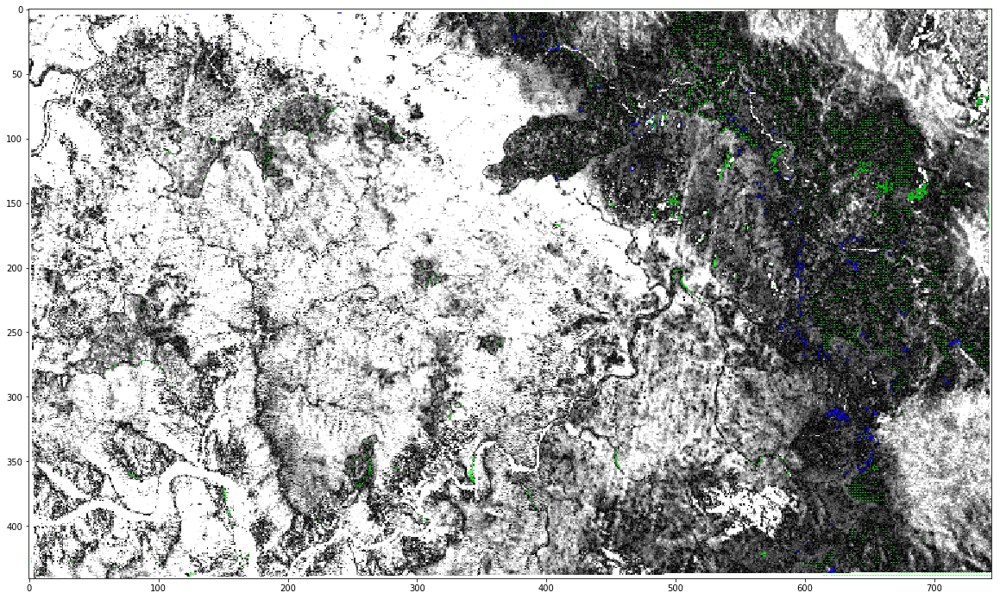

In [85]:
view = imshow(d, (0, 0, 0), classes=training_errors2,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8

In [92]:
p = x.flatten()

In [93]:
p

array([19, 19, 19, ..., 19, 19, 19], dtype=int16)

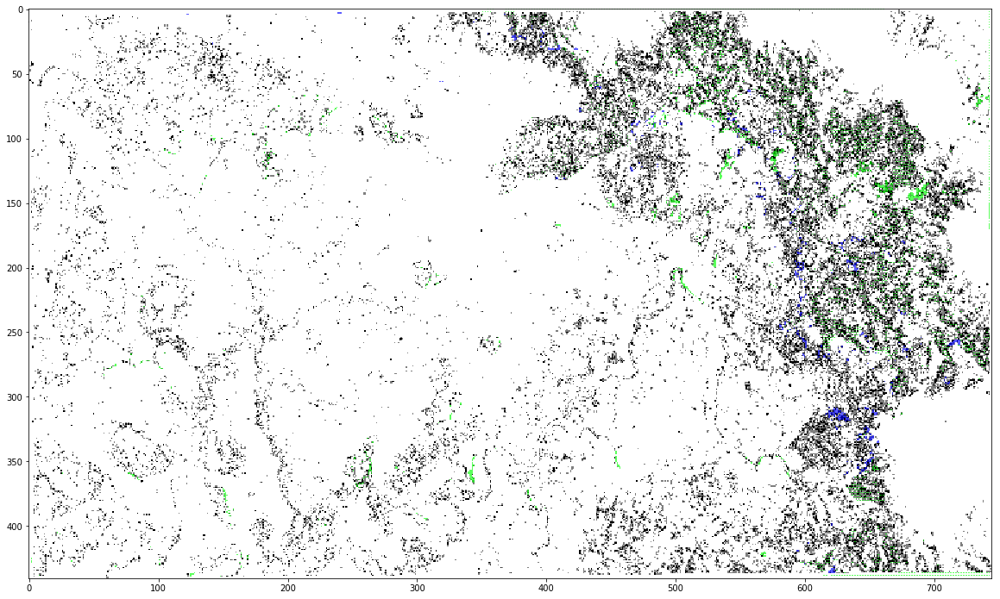

In [99]:
d = zeros(spy_image.shape[:2], np.int16)
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(x[i][j]<2.0):
            d[i][j] = x[i][j]
        else:
            d[i][j] = 2.0
            
view = imshow(d, (0, 0, 0), classes=training_errors2,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8

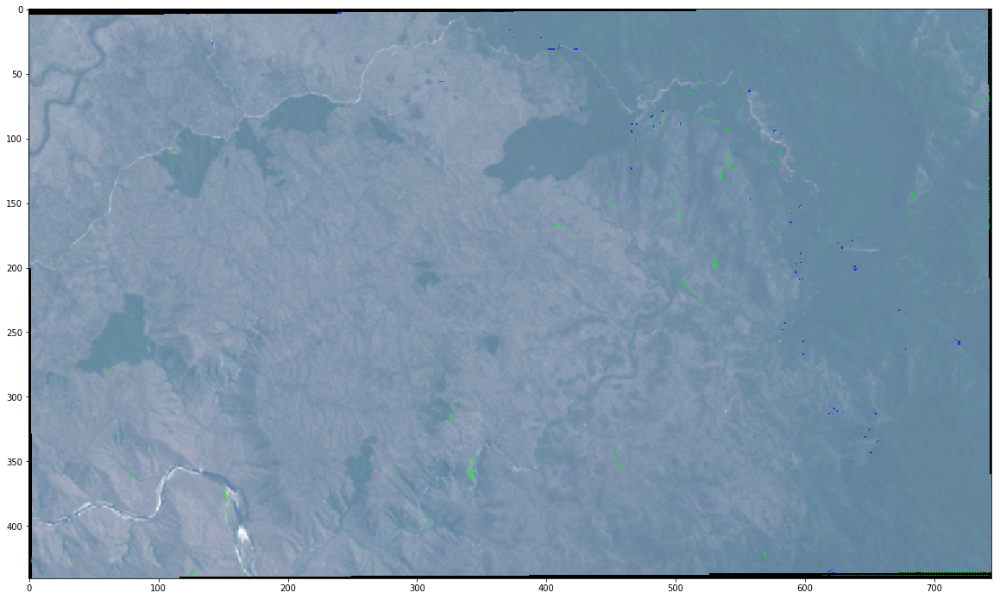

In [101]:
d = zeros(spy_image.shape[:2], np.int16)
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(training_errors2[i][j] != 0):
            if(x[i][j]>2.0):
                d[i][j] = training_errors2[i][j]

            
view = imshow(spy_image, (3, 2, 1), classes=d,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8

In [ ]:
# Vary threshold for nLL difference that is "Acceptable"
# find optimal threshold that eliminates the fewest pixels while 
# having the best impact on confusion matrix

In [191]:
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')
import decimal
for pcutoff in range(0,20):
    cutoff = 0.0 + (pcutoff * 0.2)
    d = np.copy(gtresultst1)
    ds = 0
    for i in range(0,spy_image.shape[0]):
        #print(i)
        #print(ds)
        for j in range(0,spy_image.shape[1]):
            if(training_errors2[i][j] != 0):
                if(x[i][j]<cutoff):
                    ds += 1
                    d[i][j] = hnon[i][j]

    #print(pcutoff)
    #print(cutoff)
    print(f"sd:{ds}")
    #training_errors3 = d * (d != hnon)
    #view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
    #view.set_display_mode('overlay')
    #view.class_alpha = 0.8
    gnf = d.flatten()
    gnfnz = gnf[gnf != 0]
    y_pred = pd.Series(gnfnz.flatten(), name='Predicted')
    df_confusion_nz = pd.crosstab(y_actu, y_pred)
    df_conf_norm = df_confusion_nz / df_confusion_nz.sum(axis=1)
    print(cutoff)
    print(df_conf_norm)
    print("Cohen's Kappa:")
    print(sklearn.metrics.cohen_kappa_score(y_actu, y_pred))
    print("\nBalanced Accuracy:")
    print(sklearn.metrics.balanced_accuracy_score(y_actu, y_pred))

sd:0
0.0
Predicted         2         3
Actual                       
2.0        0.869440  0.026193
3.0        0.547878  0.890085
Cohen's Kappa:
0.6509479547518336

Balanced Accuracy:
0.8797622702530716
sd:506
0.2
Predicted         2         3
Actual                       
2.0        0.885569  0.022957
3.0        0.478098  0.904084
Cohen's Kappa:
0.6894397439310871

Balanced Accuracy:
0.8948263435877308
sd:988
0.4
Predicted         2         3
Actual                       
2.0        0.902547  0.019551
3.0        0.413243  0.917095
Cohen's Kappa:
0.7277827425300902

Balanced Accuracy:
0.9098209791081668
sd:1382
0.6000000000000001
Predicted         2         3
Actual                       
2.0        0.914601  0.017133
3.0        0.358404  0.928097
Cohen's Kappa:
0.759791534425974

Balanced Accuracy:
0.9213490123522686
sd:1728
0.8
Predicted         2         3
Actual                       
2.0        0.925297  0.014987
3.0        0.310357  0.937736
Cohen's Kappa:
0.788742961096399

Balan

In [239]:

rdf = pd.DataFrame(columns=['cutoff', 'kappa', 'accuracy','pixels_proportion_excluded'])
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

for pcutoff in range(0,40):
    cutoff = 0.0 + (pcutoff * 0.1)
    d = np.copy(gtresultst1)
    ds = 0
    for i in range(0,spy_image.shape[0]):
        #print(i)
        #print(ds)
        for j in range(0,spy_image.shape[1]):
            #if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                    ds += 1
                    d[i][j] = hnon[i][j]

    #print(pcutoff)
    #print(cutoff)
    #print(f"sd:{ds}")
    #training_errors3 = d * (d != hnon)
    #view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
    #view.set_display_mode('overlay')
    #view.class_alpha = 0.8
    gnf = d.flatten()
    gnfnz = gnf[gnf != 0]
    y_pred = pd.Series(gnfnz.flatten(), name='Predicted')
    df_confusion_nz = pd.crosstab(y_actu, y_pred)
    df_conf_norm = df_confusion_nz / df_confusion_nz.sum(axis=1)
    #print(cutoff)
    kappa = sklearn.metrics.cohen_kappa_score(y_actu, y_pred)
    accu = sklearn.metrics.balanced_accuracy_score(y_actu, y_pred)
    yap = np.zeros(len(y_pred))
    yat = np.zeros(len(y_pred))
    for j in range(0,len(y_pred)):
        if y_actu[j] == y_pred[j]:
            yap[j] = 1
            yat[j] = 1
        else:
            yap[j] = 1
            yat[j] = 0
    fpr, tpr, _ = sklearn.metrics.roc_curve(yat, yap)
    auc_score = sklearn.metrics.auc(fpr, tpr)
    print(auc_score)
    
    

    rdf = rdf.append({
     "cutoff": cutoff,
     "kappa":  kappa,
        "accuracy": accu,
        "pixels_proportion_excluded": ds / 328545
      }, ignore_index=True)

0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5
0.5


KeyboardInterrupt: 

In [240]:

rdf = pd.DataFrame(columns=['cutoff', 'kappa', 'accuracy','pixels_proportion_excluded'])
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

for pcutoff in range(0,40):
    cutoff = 0.0 + (pcutoff * 0.1)
    d = np.copy(gtresultst1)
    ds = 0
    for i in range(0,spy_image.shape[0]):
        #print(i)
        #print(ds)
        for j in range(0,spy_image.shape[1]):
            #if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                    ds += 1
                    d[i][j] = hnon[i][j]

    #print(pcutoff)
    #print(cutoff)
    #print(f"sd:{ds}")
    #training_errors3 = d * (d != hnon)
    #view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
    #view.set_display_mode('overlay')
    #view.class_alpha = 0.8
    gnf = d.flatten()
    gnfnz = gnf[gnf != 0]
    y_pred = pd.Series(gnfnz.flatten(), name='Predicted')
    df_confusion_nz = pd.crosstab(y_actu, y_pred)
    df_conf_norm = df_confusion_nz / df_confusion_nz.sum(axis=1)
    #print(cutoff)
    kappa = sklearn.metrics.cohen_kappa_score(y_actu, y_pred)
    accu = sklearn.metrics.balanced_accuracy_score(y_actu, y_pred)
    rdf = rdf.append({
     "cutoff": cutoff,
     "kappa":  kappa,
        "accuracy": accu,
        "pixels_proportion_excluded": ds / 328545
      }, ignore_index=True)

In [215]:
rdf

,cutoff,kappa,accuracy,pixel_error
0,0.0,0.650948,0.879762,0.0
1,0.1,0.671456,0.887330,3045.0
2,0.2,0.689440,0.894826,6046.0
3,0.3,0.709753,0.902630,9064.0
4,0.4,0.727783,0.909821,12144.0
5,0.5,0.744423,0.915908,15246.0
6,0.6,0.759792,0.921349,18284.0
7,0.7,0.775419,0.926858,21168.0
8,0.8,0.788743,0.931517,24014.0
9,0.9,0.803048,0.936346,26958.0


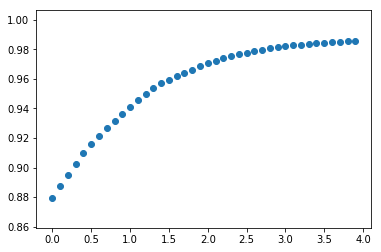

In [223]:
plt.scatter(rdf["cutoff"],rdf["accuracy"])

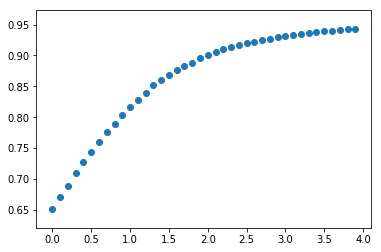

In [217]:
plt.scatter(rdf["cutoff"],rdf["kappa"])

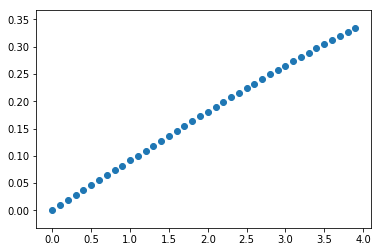

In [225]:
plt.scatter(rdf["cutoff"],rdf["pixels_proportion_excluded"])

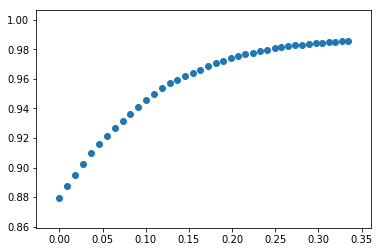

In [241]:
plt.scatter(rdf["pixels_proportion_excluded"],rdf["accuracy"])

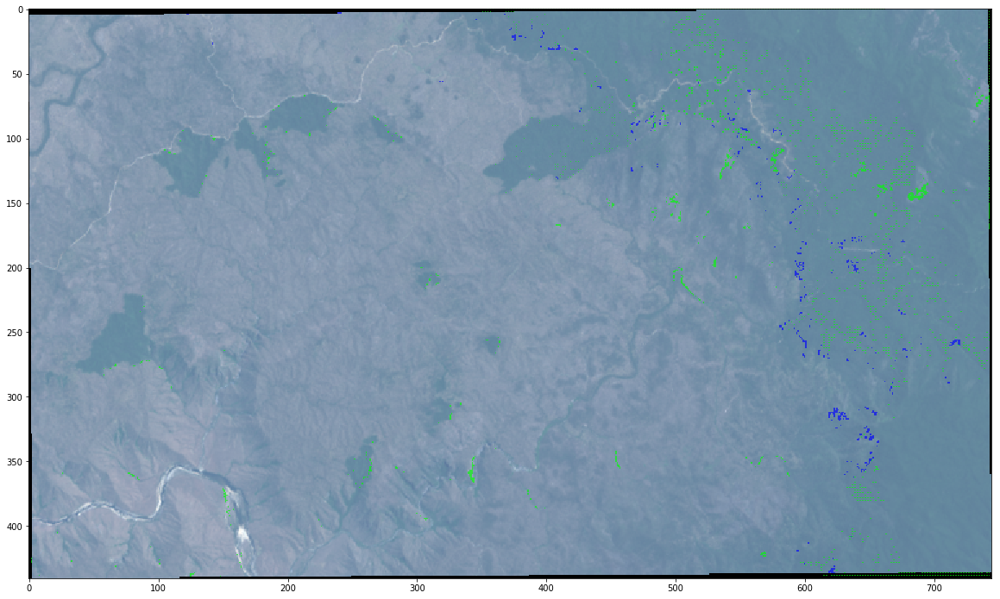

In [173]:
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

cutoff = 0.5b
d = np.copy(gtresultst1)
ds = 0
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                ds += 1
                d[i][j] = hnon[i][j]

 
training_errors3 = d * (d != hnon)
view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8
 

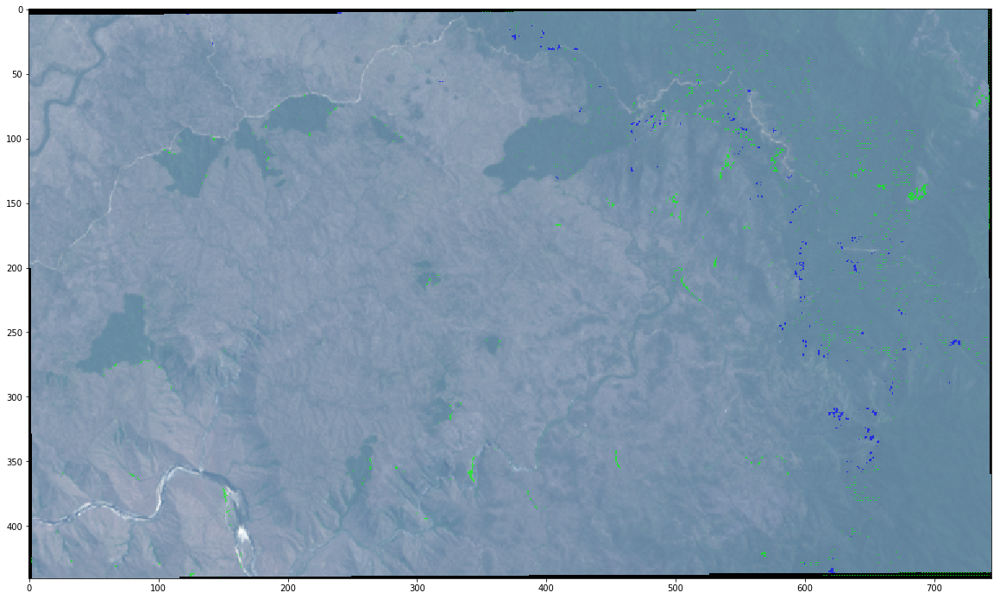

In [204]:
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

cutoff = 1.0
d = np.copy(gtresultst1)
ds = 0
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                ds += 1
                d[i][j] = hnon[i][j]

 
training_errors3 = d * (d != hnon)
view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8

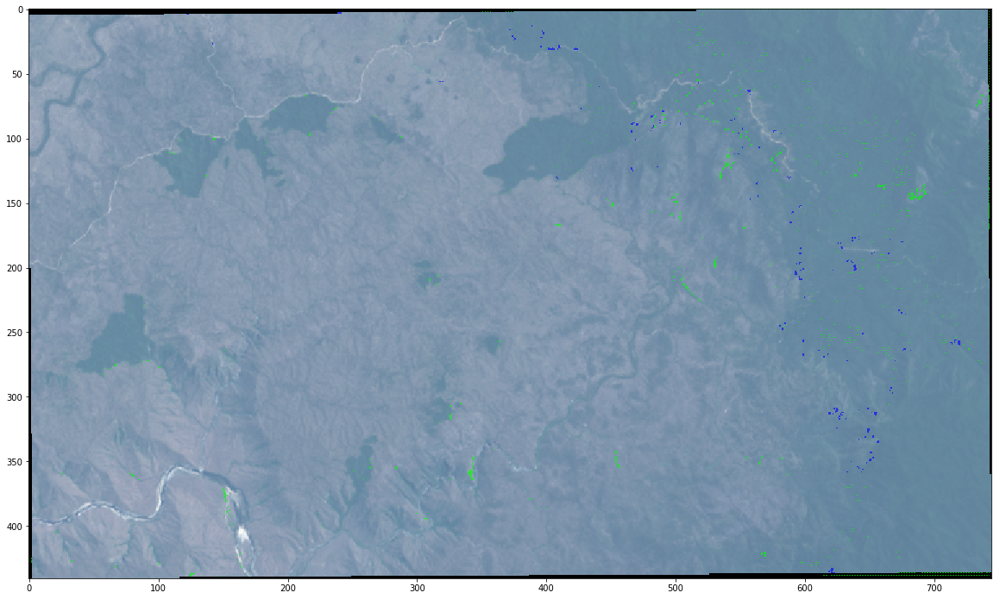

In [206]:
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

cutoff = 1.5
d = np.copy(gtresultst1)
ds = 0
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                ds += 1
                d[i][j] = hnon[i][j]

 
training_errors3 = d * (d != hnon)
view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8

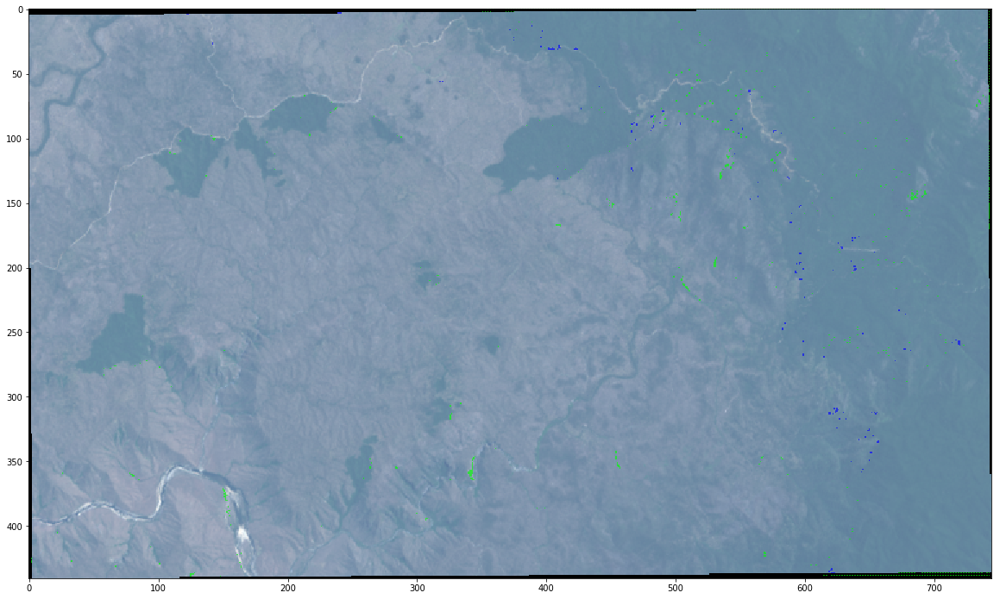

In [205]:
d = np.copy(gtresultst1)
dz = zeros((441, 745))
hnf = hnon.flatten()
hnfnz = hnf[hnf != 0]
y_actu = pd.Series(hnfnz.flatten(), name='Actual')

cutoff = 2.0
d = np.copy(gtresultst1)
ds = 0
for i in range(0,spy_image.shape[0]):
    for j in range(0,spy_image.shape[1]):
        if(training_errors2[i][j] != 0):
            if(x[i][j]<cutoff):
                ds += 1
                d[i][j] = hnon[i][j]

 
training_errors3 = d * (d != hnon)
view = imshow(spy_image, (3, 2, 1), classes=training_errors3,figsize=(20,20))
view.set_display_mode('overlay')
view.class_alpha = 0.8